In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from PIL import Image as ima
import tensorflow as tf
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt

In [ ]:
!git clone https://github.com/misbah4064/facial_expressions.git
%cd facial_expressions/
!ls

Cloning into 'facial_expressions'...
remote: Enumerating objects: 14243, done.
remote: Total 14243 (delta 0), reused 0 (delta 0), pack-reused 14243
Receiving objects: 100% (14243/14243), 240.06 MiB | 29.44 MiB/s, done.
Resolving deltas: 100% (232/232), done.
Checking out files: 100% (14004/14004), done.
/content/facial_expressions
anger.txt   haarcascade_frontalface_default.xml  neutral.txt  sad.txt
data	    happy.txt				 python       surprise.txt
dwayne.jpg  images				 R	      test
elon.jpg    LICENSE				 README.md


In [ ]:
def face_return(paths):
  face_detector = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
  img=cv2.imread(paths)
  gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  faces = face_detector.detectMultiScale(gray,minSize = (200, 200))
  for(x,y,w,h) in faces:
    array=[]
    for i in range(x,x+w):
      x=[]
      for j in range(y,y+h):
       x.append(img[i,j])
      array.append(x)
    np_array=np.array(array)   
    img=ima.fromarray(np_array)
  img=cv2.cvtColor(np.uint8(img),cv2.COLOR_BGR2RGB)
  return img  

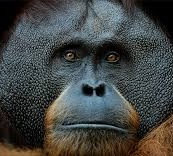

In [ ]:
from google.colab.patches import cv2_imshow
img_modified=face_return("10.jpg")
img_modified=cv2.cvtColor(img_modified,cv2.COLOR_BGR2RGB)
cv2_imshow(img_modified)

In [ ]:
from PIL import Image  
import PIL 
def image_mix(x1,x2):
  x1=cv2.resize(x1,(600,600))
  x2=cv2.resize(x2,(600,600))
  plt.imshow(x2)
  plt.show()
  x=np.asarray(x1)
  y=np.asarray(x2)
  z=(x+y)/2
  for i in range(len(z)):
      for j in range(len(z[0])):
          for k in range(len(z[0][0])):
              if(x[i][j][k]<y[i][j][k]):
                  z[i][j][k]=x[i][j][k]+y[i][j][k]/5
              else:
                  z[i][j][k]=y[i][j][k]
  z=z.astype(int)
  imga=ima.fromarray(z.astype(np.uint8))
  imga=cv2.cvtColor(z.astype(np.uint8),cv2.COLOR_BGR2RGB)
 # plt.imshow(imga)
  #plt.show()
  imga=ima.fromarray(imga)
  return imga

In [ ]:
from tensorflow import keras
from tensorflow.keras import models,optimizers,layers,losses
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import MaxPool2D,Conv2D,Dense,Flatten
from tensorflow.keras.optimizers import Adam,Adamax,SGD
from tensorflow.keras.losses import CategoricalCrossentropy,SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
training=ImageDataGenerator(rescale=1/255).flow_from_directory("/content/drive/MyDrive/HUMAN_SPECIES/train",batch_size=32,target_size=(224,224),class_mode='sparse')
validation=ImageDataGenerator(rescale=1/255).flow_from_directory("/content/drive/MyDrive/HUMAN_SPECIES/validation",batch_size=32,target_size=(224,224),class_mode='sparse')

Found 274 images belonging to 4 classes.
Found 105 images belonging to 4 classes.


In [ ]:
model=Sequential()
model.add(Conv2D(16,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Conv2D(32,(3,3),activation='relu'))
model.add(MaxPool2D((2,2)))
model.add(Flatten())
model.add(Dense(300,activation='relu'))
model.add(Dense(150,activation='relu'))
model.add(Dense(4,activation='softmax'))

In [ ]:
model.compile(loss=SparseCategoricalCrossentropy(),optimizer=Adam(learning_rate=0.001),metrics='accuracy')

In [ ]:
model.fit(training,epochs=7,validation_data=validation)

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch 1/7
9/9 [==============================] - 69s 7s/step - loss: 4.4238 - accuracy: 0.2263 - val_loss: 1.4291 - val_accuracy: 0.3048
Epoch 2/7
9/9 [==============================] - 14s 2s/step - loss: 1.3952 - accuracy: 0.3358 - val_loss: 1.3845 - val_accuracy: 0.3048
Epoch 3/7
9/9 [==============================] - 14s 2s/step - loss: 1.2578 - accuracy: 0.4161 - val_loss: 1.3750 - val_accuracy: 0.2190
Epoch 4/7
9/9 [==============================] - 14s 2s/step - loss: 1.0814 - accuracy: 0.5803 - val_loss: 1.3584 - val_accuracy: 0.3333
Epoch 5/7
9/9 [==============================] - 15s 2s/step - loss: 0.8478 - accuracy: 0.7007 - val_loss: 1.1989 - val_accuracy: 0.4952
Epoch 6/7
9/9 [==============================] - 14s 2s/step - loss: 0.6152 - accuracy: 0.8066 - val_loss: 1.2969 - val_accuracy: 0.4571
Epoch 7/7
9/9 [==============================] - 14s 2s/step - loss: 0.3582 - accuracy: 0.9124 - val_loss: 1.2241 - val_accuracy: 0.5429


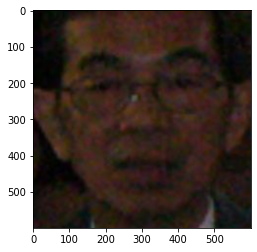

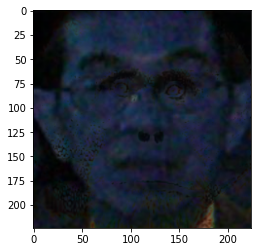

Homo Erectus


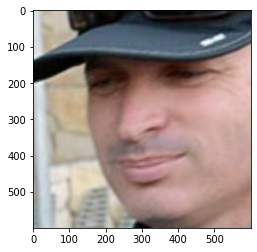

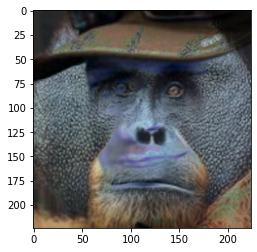

Australopithecus


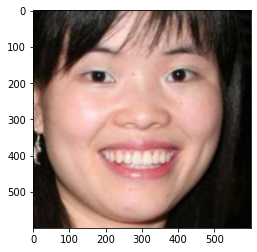

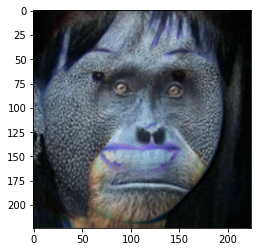

Australopithecus


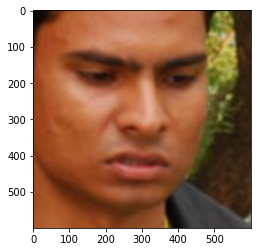

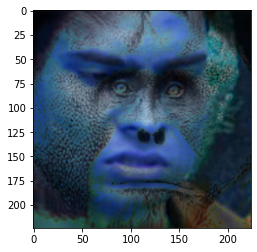

Homo Erectus


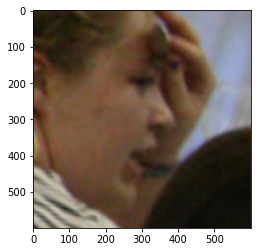

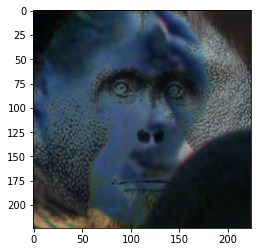

Homo Erectus


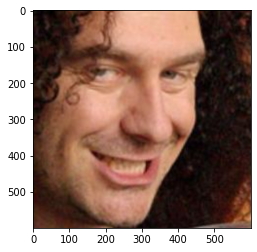

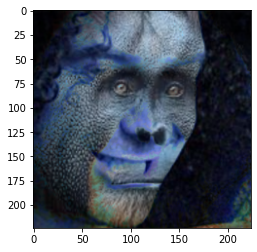

Australopithecus


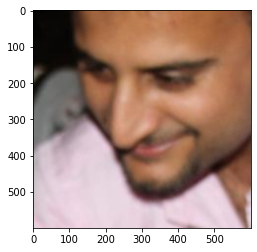

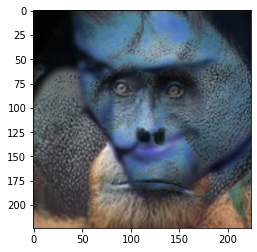

Homo Erectus


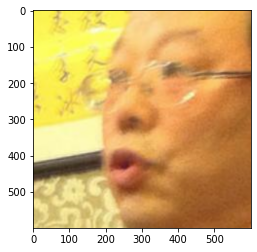

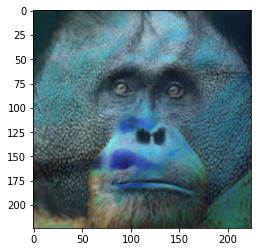

Homo Erectus


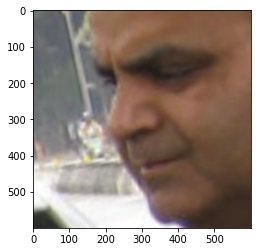

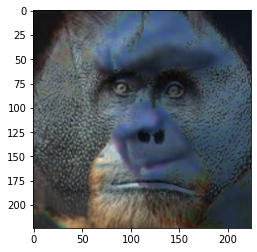

Australopithecus


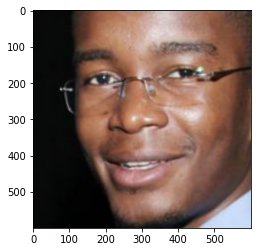

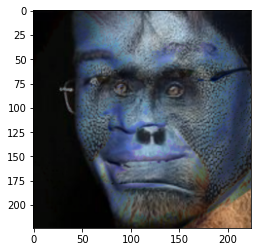

Australopithecus


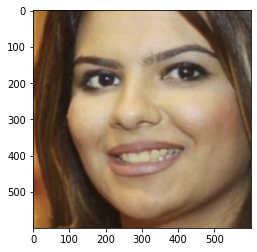

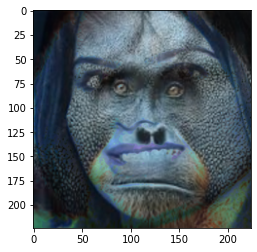

Australopithecus


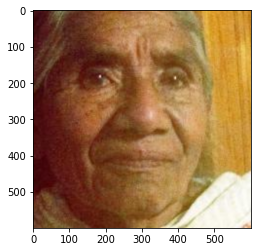

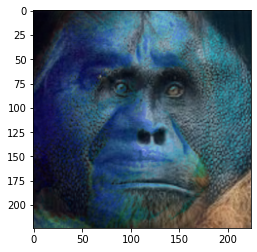

Homo Erectus


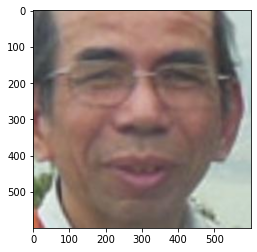

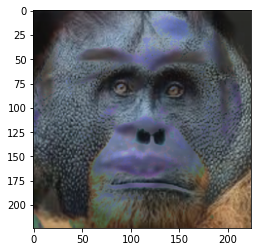

Australopithecus


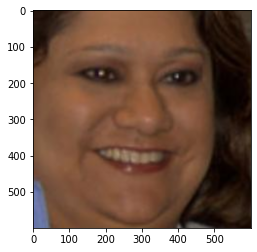

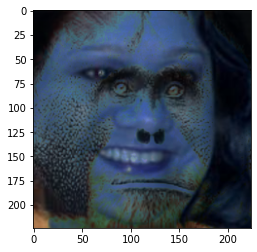

Australopithecus


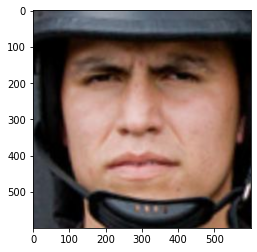

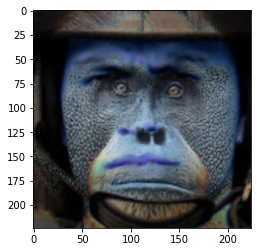

Australopithecus


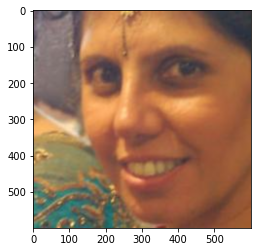

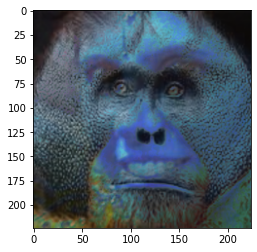

Australopithecus


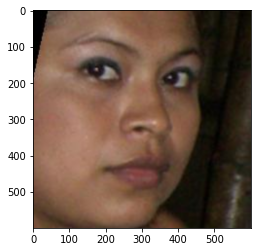

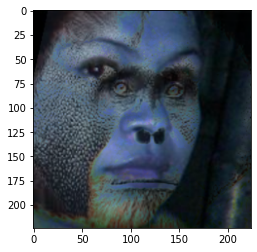

Australopithecus


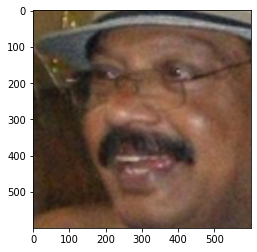

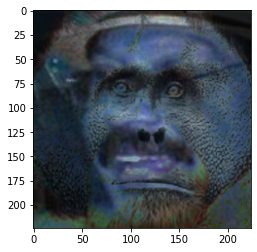

Australopithecus


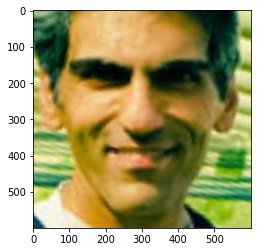

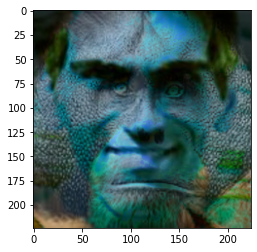

Australopithecus


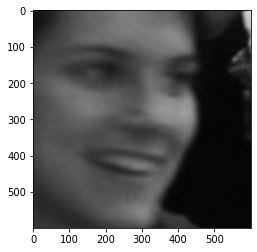

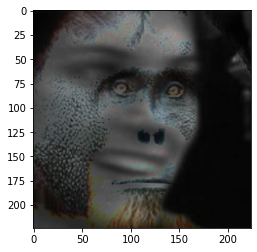

Australopithecus


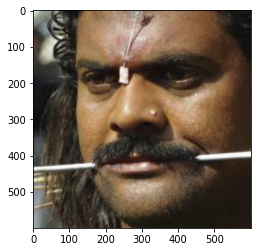

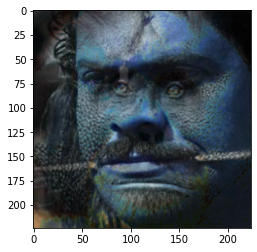

Australopithecus


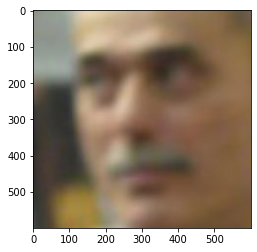

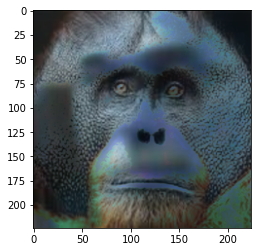

Australopithecus


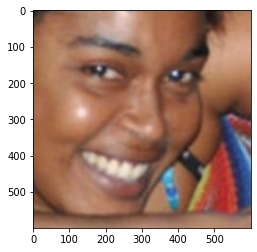

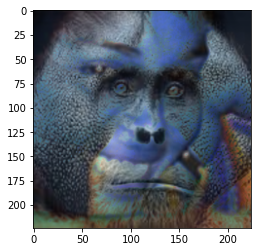

Australopithecus


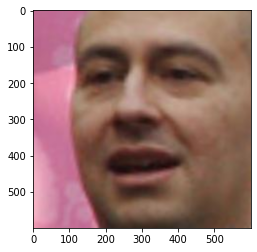

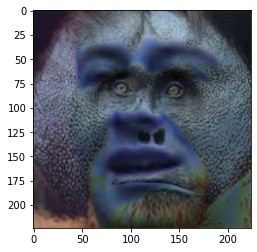

Homo Erectus


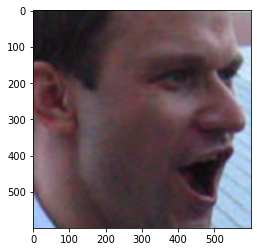

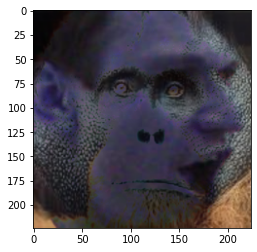

Homo Erectus


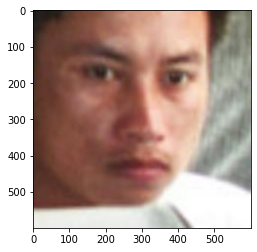

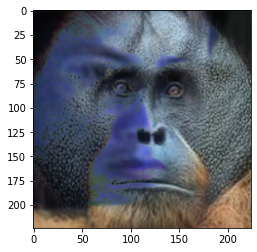

Australopithecus


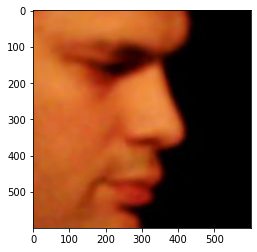

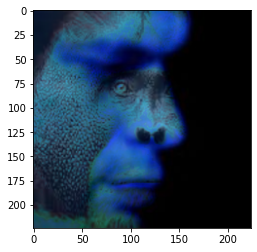

Australopithecus


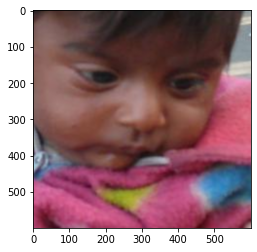

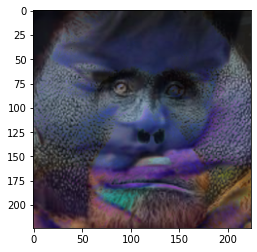

Australopithecus


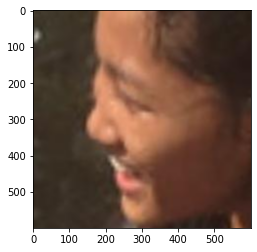

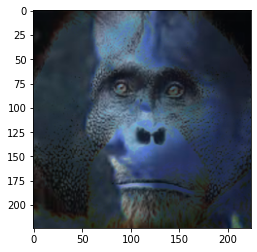

Australopithecus


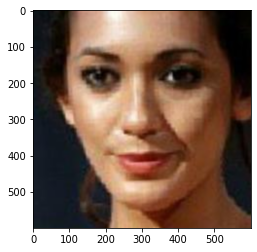

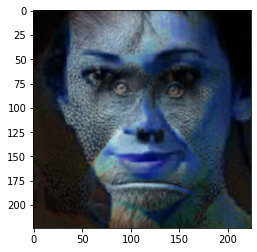

Australopithecus


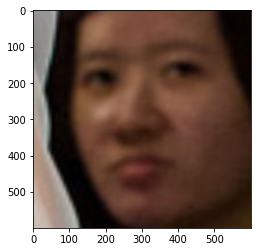

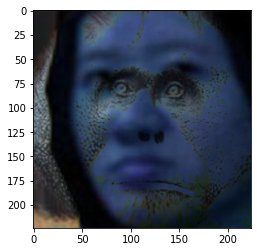

Homo Erectus


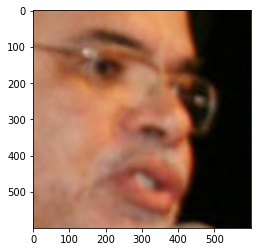

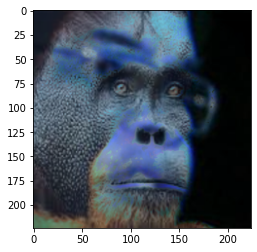

Australopithecus


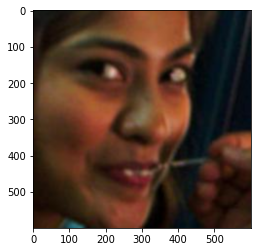

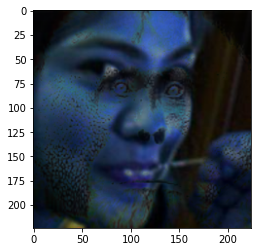

Australopithecus


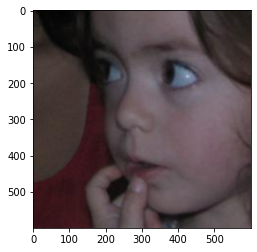

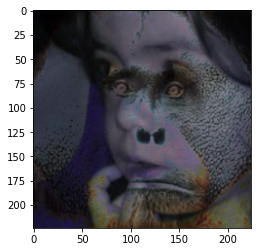

Australopithecus


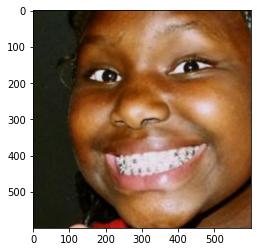

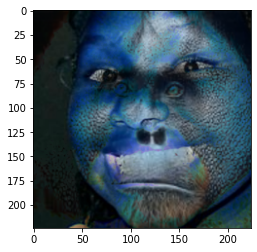

Homo Erectus


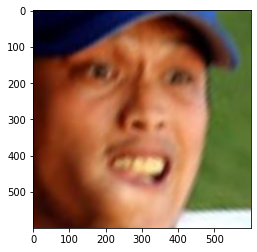

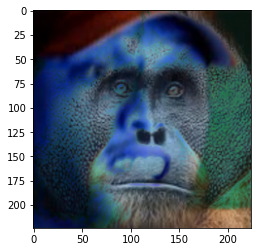

Homo Erectus


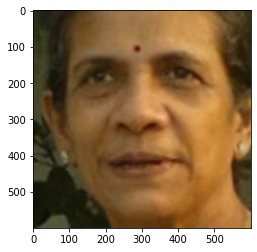

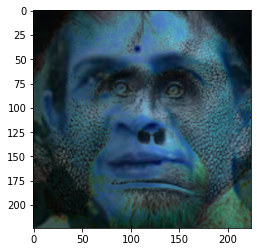

Homo Erectus


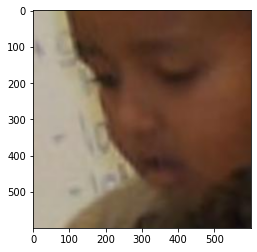

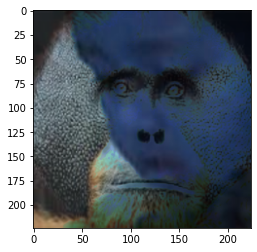

Homo Erectus


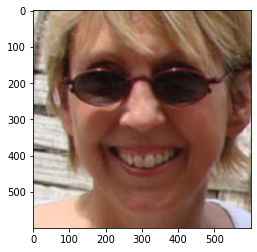

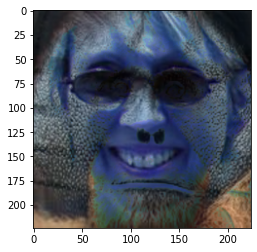

Australopithecus


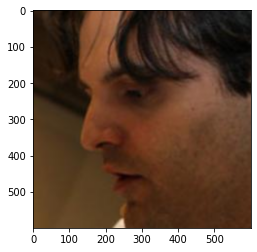

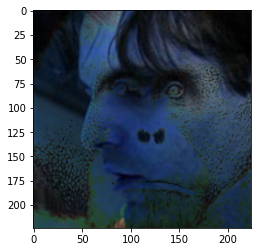

Homo Erectus


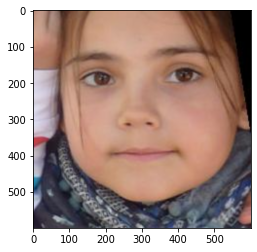

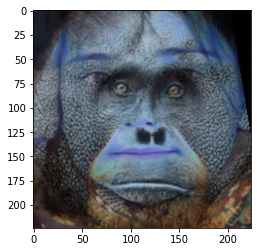

Australopithecus


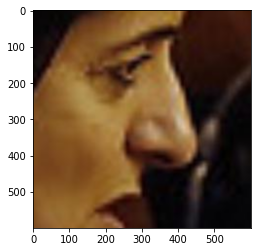

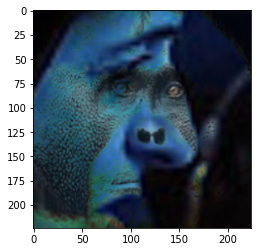

Homo Erectus


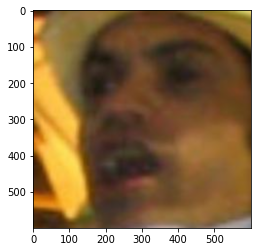

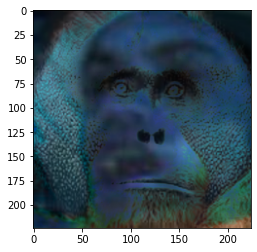

Homo Erectus


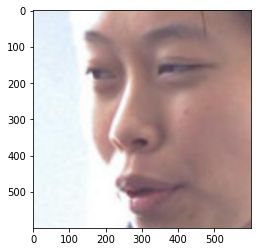

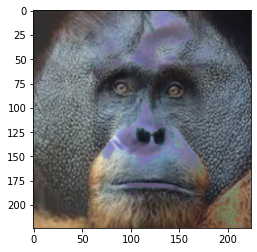

Australopithecus


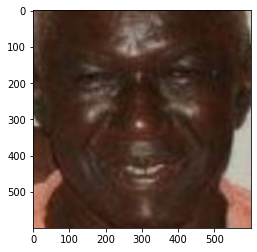

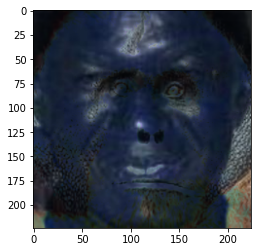

Homo Erectus


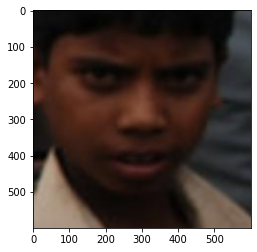

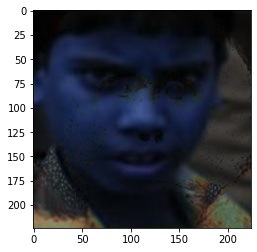

Homo Erectus


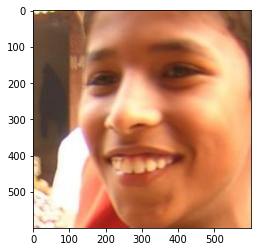

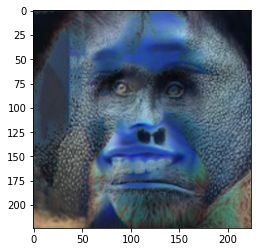

Australopithecus


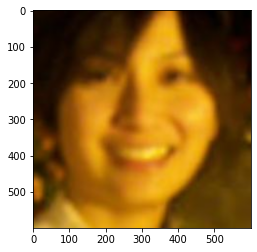

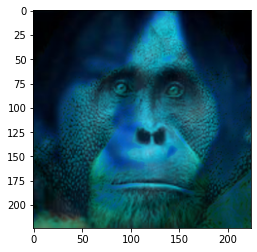

Homo Erectus


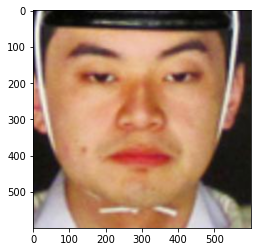

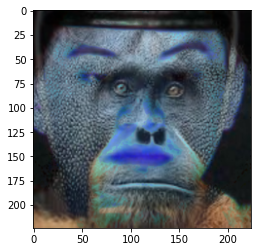

Australopithecus


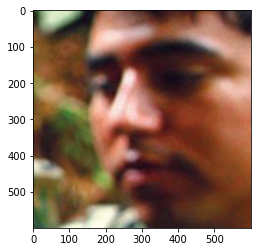

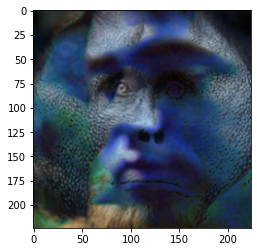

Homo Erectus


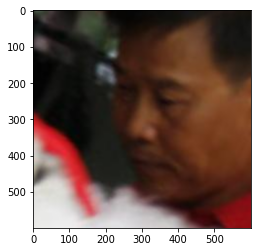

In [ ]:
import os
dir="/content/drive/MyDrive/faces/"
for i in os.listdir(dir):
  x1=img_modified
  x2=face_return(dir+i)
  X=image_mix(x1,x2)
  X=X.resize((224,224))
  imga=image.load_img(dir+i)
  plt.imshow(X)
  plt.show()
  X=np.expand_dims(X,axis=0)
  face=np.vstack([X])
  d=model.predict(face)  
  i=0
  max=d[0][0]
  for j in range(len(d[0])):
    if(d[0][j]>max):
      max=d[0][j]
      i=j
  d=['Australopithecus','Homo Erectus','Homo Habilis','Homo Neanderthals']  
  print(d[i])  